In [1]:
import sys

In [2]:
import scvelo as scv
import scanpy as sc
import cellrank as cr
import numpy as np

scv.settings.verbosity = 3
scv.settings.set_figure_params("scvelo")
cr.settings.verbosity = 2

In [3]:
import warnings
warnings.simplefilter("ignore", category=UserWarning)
warnings.simplefilter("ignore", category=FutureWarning)
warnings.simplefilter("ignore", category=DeprecationWarning)

In [4]:
import os
os.getcwd()

'/Volumes/groups/tanaka/People/current/jiwang/projects/RA_competence/scripts'

In [5]:
input_Dir = "../results/scRNAseq_R13547_10x_mNT_20220813/RA_symetryBreaking/cellRank_scvelo_d2.5.to.d6_rm.weired.clusters/"
outDir = "../results/scRNAseq_R13547_10x_mNT_20220813/RA_symetryBreaking/cellRank_scvelo_d2.5.to.d6_rm.weired.clusters/"

In [6]:
data_seuratObj = os.path.join(input_Dir, 
                              "RNAmatrix_umap_alevin.spliced_unspliced_RA_downsample_6k_v4.2_rmCellCycle.correlatedGenes.h5ad")
adata = sc.read_h5ad(data_seuratObj, chunk_size=6000)

In [7]:
adata

AnnData object with n_obs × n_vars = 6000 × 14634
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'condition', 'iscell_dd', 'cell.id', 'percent.mt', 'DF_out', 'percent.rb', 'S.Score', 'G2M.Score', 'Phase', 'celltypes', 'RNA_snn_res.0.5', 'seurat_clusters', 'RNA_snn_res.0.7', 'clusters', 'time', 'nCount_spliced', 'nFeature_spliced', 'nCount_unspliced', 'nFeature_unspliced'
    var: 'vst.mean', 'vst.variance', 'vst.variance.expected', 'vst.variance.standardized', 'vst.variable', 'spliced_features', 'unspliced_features'
    obsm: 'X_umap'
    layers: 'spliced', 'unspliced'

In [8]:
adata.layers.keys()

KeysView(Layers with keys: spliced, unspliced)

In [9]:
adata.obs['condition']= adata.obs['condition'].astype('category') # change the condition into category type
adata.obs['celltypes']= adata.obs['celltypes'].astype('category')
adata.obs['clusters']= adata.obs['clusters'].astype('category')

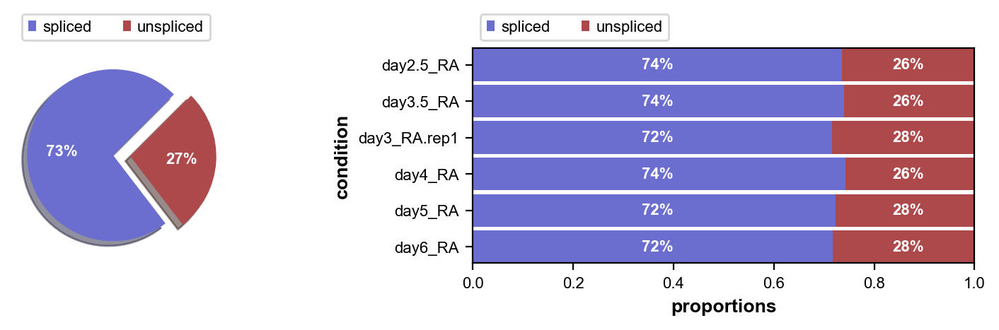

In [10]:
#adata = cr.datasets.pancreas()

scv.pl.proportions(adata, groupby='condition')


In [11]:
scv.pp.filter_and_normalize(adata, 
                            min_shared_counts=20, n_top_genes=3000, 
                            flavor = 'seurat', 
                            layers_normalize={'X', 'spliced', 'unspliced'}) # by specifying layers_normalize to renormalize the counts 
sc.tl.pca(adata)
sc.pp.neighbors(adata, n_pcs=30, n_neighbors=30)
scv.pp.moments(adata, n_pcs=None, n_neighbors=None)

Filtered out 5137 genes that are detected 20 counts (shared).
Normalized count data: X, spliced, unspliced.
Extracted 3000 highly variable genes.


OMP: Info #276: omp_set_nested routine deprecated, please use omp_set_max_active_levels instead.


computing moments based on connectivities
    finished (0:00:02) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)


In [12]:
scv.tl.recover_dynamics(adata, n_jobs=10, max_iter=10) # slow step and require high memory ~120G, so it is better to start the jupterlab with 150G RAM (~15-20mins)

recovering dynamics (using 10/10 cores)
or disable the progress bar using `show_progress_bar=False`.
    finished (0:01:27) --> added 
    'fit_pars', fitted parameters for splicing dynamics (adata.var)


In [13]:
adata 

AnnData object with n_obs × n_vars = 6000 × 3000
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'condition', 'iscell_dd', 'cell.id', 'percent.mt', 'DF_out', 'percent.rb', 'S.Score', 'G2M.Score', 'Phase', 'celltypes', 'RNA_snn_res.0.5', 'seurat_clusters', 'RNA_snn_res.0.7', 'clusters', 'time', 'nCount_spliced', 'nFeature_spliced', 'nCount_unspliced', 'nFeature_unspliced', 'initial_size_unspliced', 'initial_size_spliced', 'initial_size', 'n_counts'
    var: 'vst.mean', 'vst.variance', 'vst.variance.expected', 'vst.variance.standardized', 'vst.variable', 'spliced_features', 'unspliced_features', 'gene_count_corr', 'means', 'dispersions', 'dispersions_norm', 'highly_variable', 'fit_r2', 'fit_alpha', 'fit_beta', 'fit_gamma', 'fit_t_', 'fit_scaling', 'fit_std_u', 'fit_std_s', 'fit_likelihood', 'fit_u0', 'fit_s0', 'fit_pval_steady', 'fit_steady_u', 'fit_steady_s', 'fit_variance', 'fit_alignment_scaling'
    uns: 'pca', 'neighbors', 'recover_dynamics'
    obsm: 'X_umap', 'X_pca'
    varm

In [14]:
# save the velocity result
#adata.write(os.path.join(outDir,'my_results_6k.cells_velocity_recover_dynamics.h5ad'), compression="gzip")

In [15]:
# reload the calculated velocity from tl.recover_dynamics
#adata = sc.read_h5ad(os.path.join(outDir,'my_results_6k.cells_velocity_recover_dynamics.h5ad'), chunk_size=6000)

In [16]:
scv.tl.velocity(adata, mode="dynamical")

computing velocities
    finished (0:00:03) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)


computing velocity graph (using 1/10 cores)
    finished (0:00:07) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity embedding
    finished (0:00:00) --> added
    'velocity_umap', embedded velocity vectors (adata.obsm)


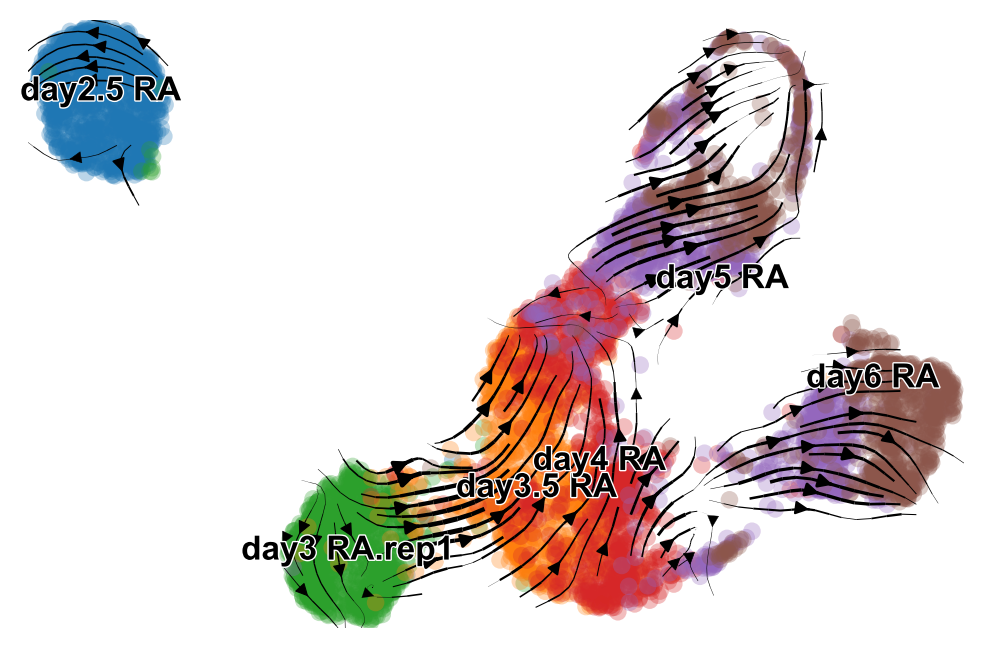

In [17]:
scv.tl.velocity_graph(adata, approx = None, sqrt_transform = None)
scv.pl.velocity_embedding_stream(
    adata, basis="umap", smooth=0.5, min_mass=1,
    legend_fontsize=12, title="", color = "condition"
)

figure cannot be saved as pdf, using png instead.
saving figure to file ../results/scRNAseq_R13547_10x_mNT_20220813/RA_symetryBreaking/cellRank_scvelo_d2.5.to.d6_rm.weired.clusters/RNAvelocity_stream_model_dynamical_stream_top3000.png


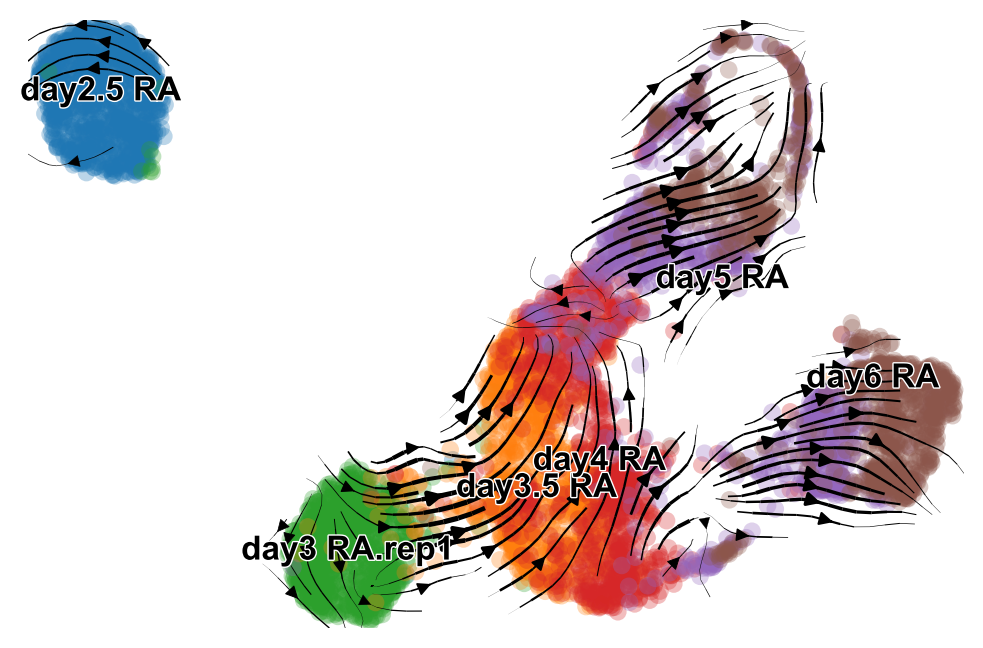

In [19]:
scv.pl.velocity_embedding_stream(
    adata, basis="umap", smooth=0.6, min_mass=1,
    legend_fontsize=12, title="", color = "condition", 
    save=os.path.join(outDir, "RNAvelocity_stream_model_dynamical_stream_top3000.pdf"))

In [20]:
#scv.tl.velocity(adata, mode="stochastic")
scv.tl.velocity(adata, mode="steady_state")

computing velocities
    finished (0:00:00) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)


computing velocity graph (using 1/10 cores)
    finished (0:00:07) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity embedding
    finished (0:00:00) --> added
    'velocity_umap', embedded velocity vectors (adata.obsm)


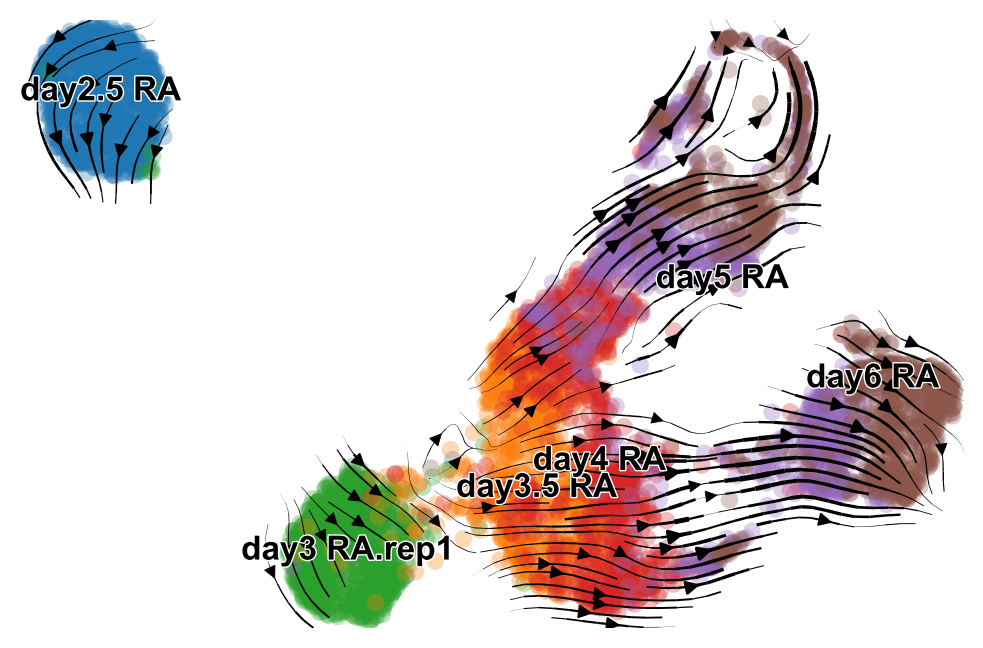

In [21]:
scv.tl.velocity_graph(adata, approx = None, sqrt_transform = None)
scv.pl.velocity_embedding_stream(
    adata, basis="umap", smooth=0.6, min_mass=1,
    legend_fontsize=12, title="", color = "condition"
)

figure cannot be saved as pdf, using png instead.
saving figure to file ../results/scRNAseq_R13547_10x_mNT_20220813/RA_symetryBreaking/cellRank_scvelo_d2.5.to.d6_rm.weired.clusters/RNAvelocity_stream_model_steadystat_stream_top3000.png


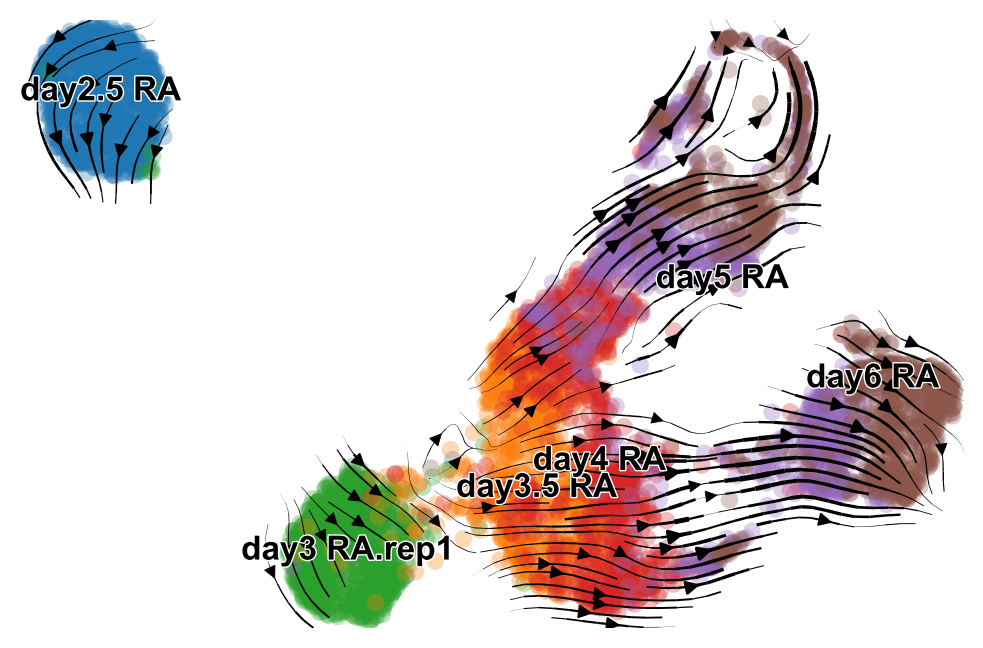

In [22]:
scv.pl.velocity_embedding_stream(
    adata, basis="umap", smooth=0.6, min_mass=1,
    legend_fontsize=12, title="", color = "condition", 
    save=os.path.join(outDir, "RNAvelocity_stream_model_steadystat_stream_top3000.pdf"))

computing velocities
    finished (0:00:02) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)
computing velocity graph (using 1/10 cores)
    finished (0:00:16) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity embedding
    finished (0:00:00) --> added
    'velocity_umap', embedded velocity vectors (adata.obsm)


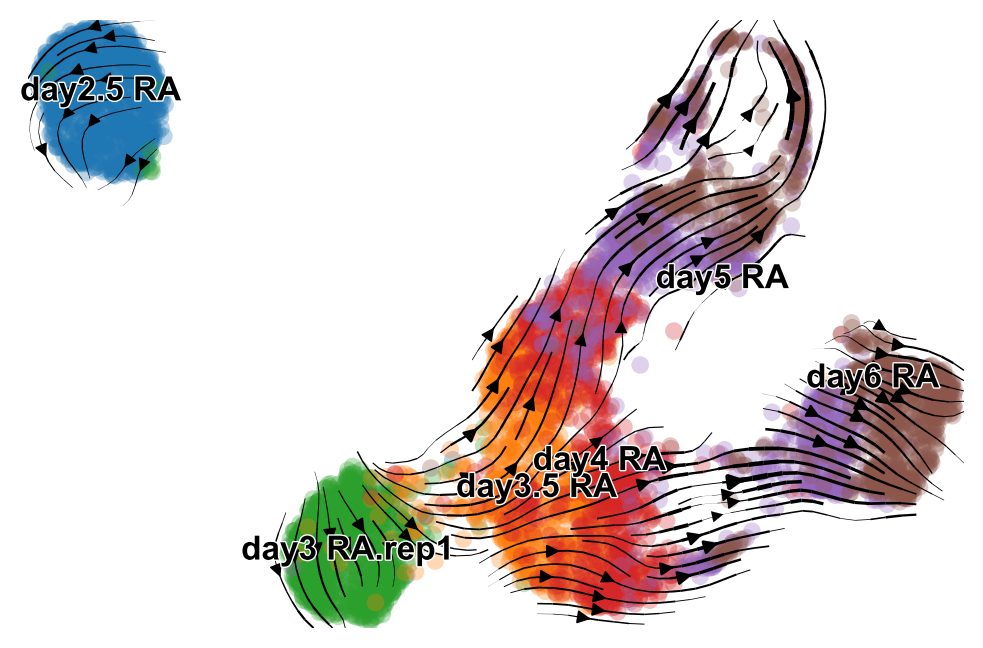

In [23]:
scv.tl.velocity(adata, mode="stochastic")
scv.tl.velocity_graph(adata)
scv.pl.velocity_embedding_stream(
    adata, basis="umap", smooth=0.5, min_mass=1,
    legend_fontsize=12, title="", color = "condition"
)

saving figure to file ../results/scRNAseq_R13547_10x_mNT_20220813/RA_symetryBreaking/cellRank_scvelo_d2.5.to.d6_rm.weired.clusters/RNAvelocity_model_stochastic_stream_top3000.pdf


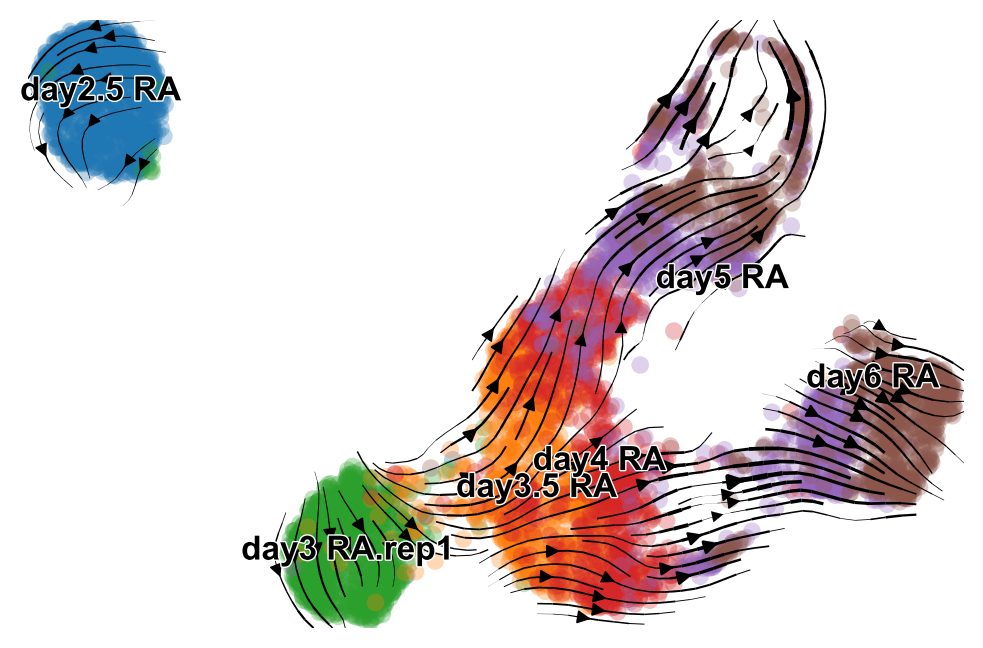

In [24]:
scv.pl.velocity_embedding_stream(
    adata, basis="umap", smooth=0.5, min_mass=1,
    legend_fontsize=12, title="", color = "condition", 
    save=os.path.join(outDir, "RNAvelocity_model_stochastic_stream_top3000.pdf"))

In [25]:
# compare three models and it seems that the steady state works relatively better for root and terminal cells

In [ ]:
#scv.tl.velocity(adata, mode="dynamical") # test dynamical model
#scv.tl.velocity(adata, mode="steady_state")
scv.tl.velocity(adata, mode="stochastic") # test dynamical model
scv.tl.velocity_graph(adata)

computing velocities
    finished (0:00:02) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)
computing velocity graph (using 1/10 cores)


computing velocity embedding
    finished (0:00:00) --> added
    'velocity_umap', embedded velocity vectors (adata.obsm)


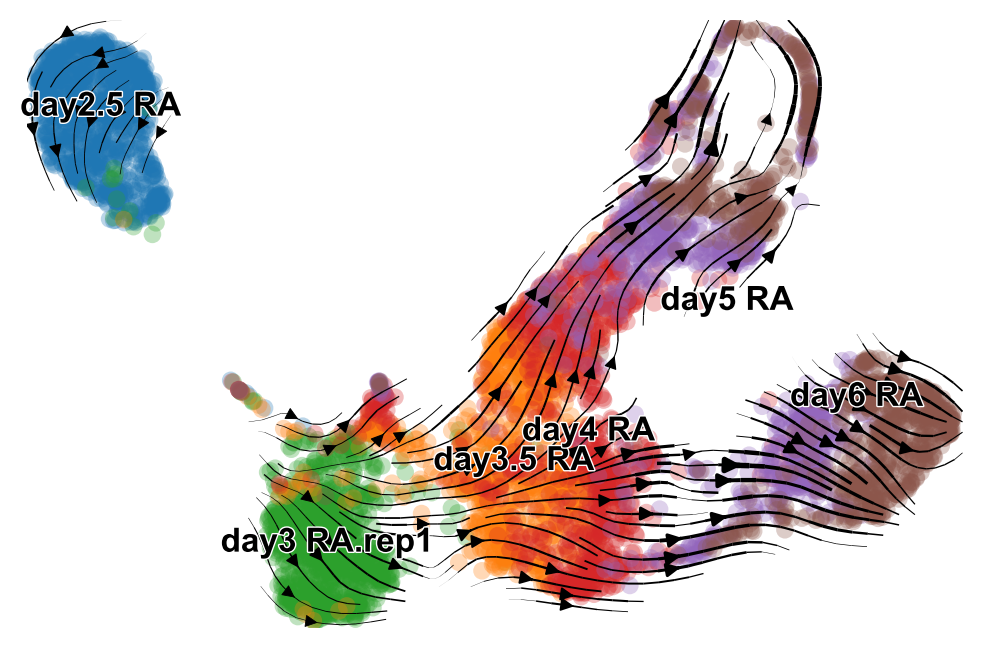

In [33]:
scv.pl.velocity_embedding_stream(
    adata, basis="umap", smooth=0.5, min_mass=1,
    legend_fontsize=12, title="", color = "condition"
)

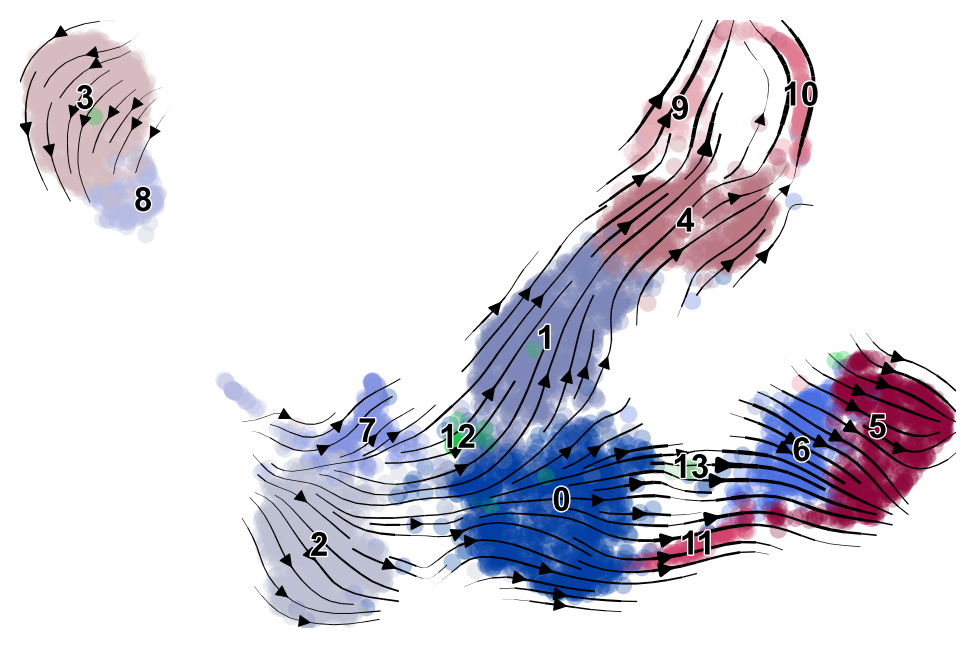

In [34]:
scv.pl.velocity_embedding_stream(
    adata, basis="umap", smooth=0.5, min_mass=1,
    legend_fontsize=12, title="", color = "clusters"
)

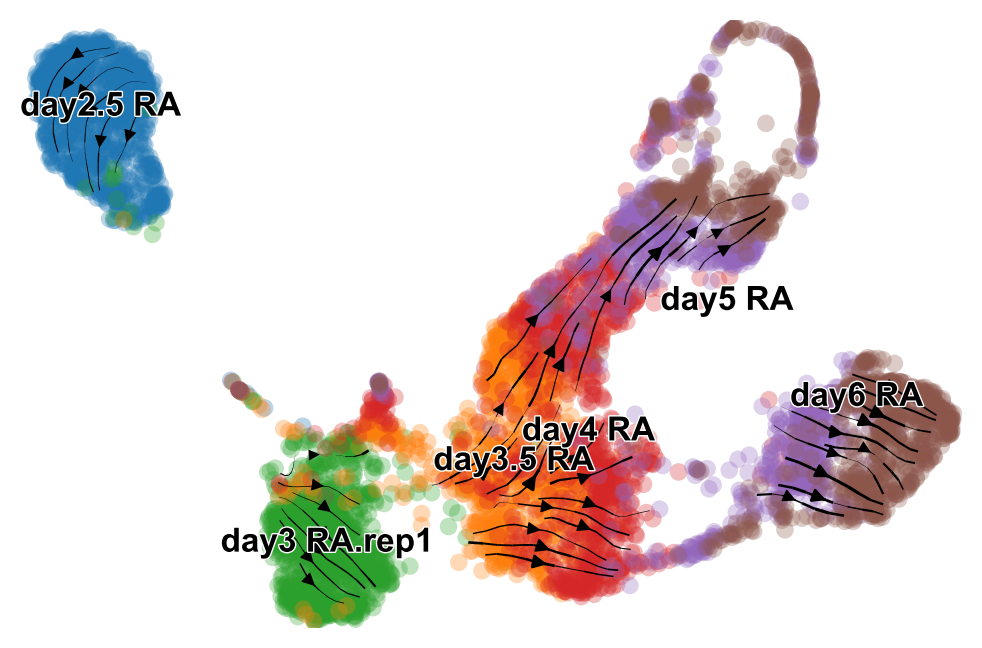

In [35]:
scv.pl.velocity_embedding_stream(
    adata, basis="umap", smooth=0.1, min_mass=1,
    legend_fontsize=12, title="", color = "condition"
)

In [36]:
adata

AnnData object with n_obs × n_vars = 6000 × 3000
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'condition', 'iscell_dd', 'cell.id', 'percent.mt', 'DF_out', 'percent.rb', 'S.Score', 'G2M.Score', 'Phase', 'celltypes', 'RNA_snn_res.1', 'seurat_clusters', 'RNA_snn_res.0.7', 'clusters', 'time', 'nCount_spliced', 'nFeature_spliced', 'nCount_unspliced', 'nFeature_unspliced', 'initial_size_unspliced', 'initial_size_spliced', 'initial_size', 'n_counts', 'velocity_self_transition'
    var: 'vst.mean', 'vst.variance', 'vst.variance.expected', 'vst.variance.standardized', 'vst.variable', 'spliced_features', 'unspliced_features', 'gene_count_corr', 'means', 'dispersions', 'dispersions_norm', 'highly_variable', 'fit_r2', 'fit_alpha', 'fit_beta', 'fit_gamma', 'fit_t_', 'fit_scaling', 'fit_std_u', 'fit_std_s', 'fit_likelihood', 'fit_u0', 'fit_s0', 'fit_pval_steady', 'fit_steady_u', 'fit_steady_s', 'fit_variance', 'fit_alignment_scaling', 'velocity_genes', 'velocity_gamma', 'velocity_qreg_ratio'

computing velocity embedding
    finished (0:00:01) --> added
    'velocity_pca', embedded velocity vectors (adata.obsm)


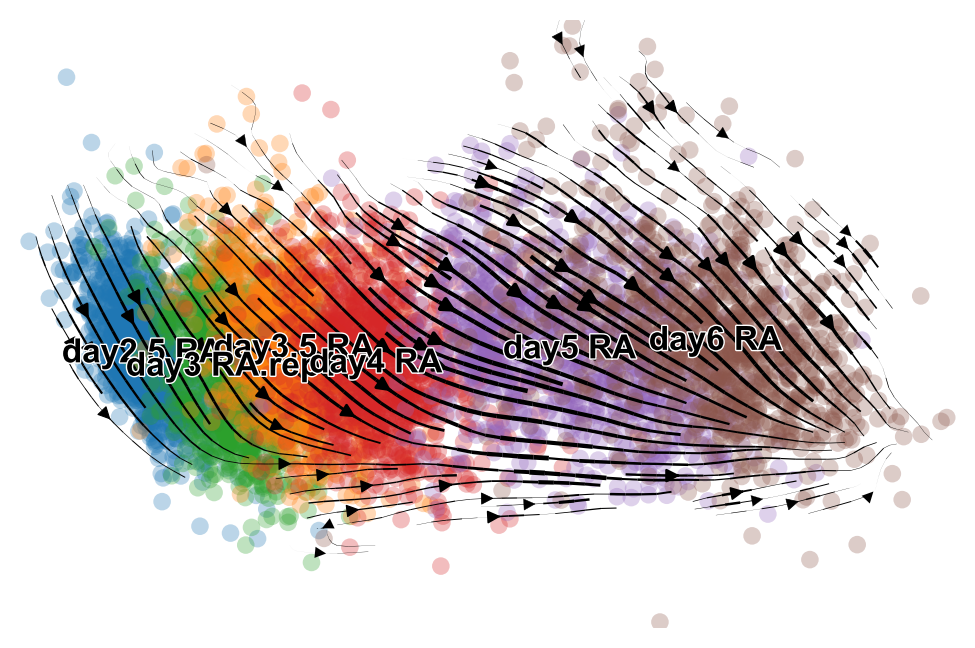

In [37]:
scv.pl.velocity_embedding_stream(
    adata, basis="pca", smooth=0.4, min_mass=0.5,
    legend_fontsize=12, title="", color = "condition"
)

In [38]:
print(adata.var.velocity_genes.sum()) # check the genes used for RNA velocity

1176


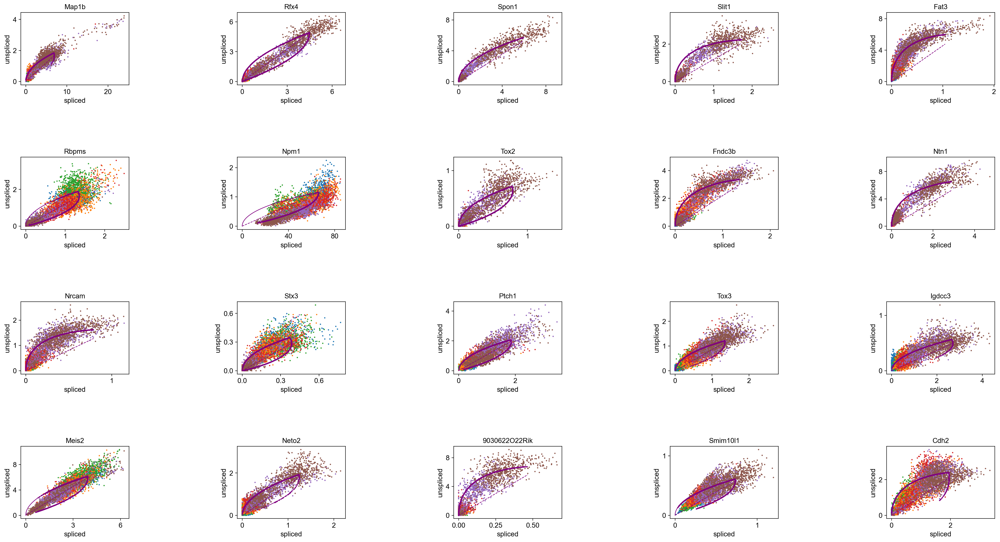

In [39]:
## top genes
top_genes = adata.var.sort_values('fit_likelihood', ascending=False).index[:20]
scv.pl.scatter(adata, basis=top_genes, color="condition", wspace=1, hspace=1, nrows=4, ncols=5)

In [40]:
# scv.pl.velocity_embedding(adata, basis="umap", arrow_length=3, arrow_size=2, dpi=120, color = "condition")
# scv.pl.velocity_embedding(adata, basis='umap',color='cell.type.fine',arrow_length=5)
# scv.pl.velocity_embedding_grid(adata, basis='umap',color='seurat_clusters',arrow_length=5)

In [41]:
#####latent time
#scv.tl.terminal_states(adata)
#scv.tl.latent_time(adata)
#scv.pl.scatter(adata, color='latent_time',color_map='gnuplot', size=80)
#scv.pl.scatter(adata, color=[ 'root_cells', 'end_points'])

In [48]:
# save the scvelo result
adata
adata.write(os.path.join(outDir,'my_results_6k.cells_scvelo_stochastic.h5ad'), compression="gzip")

In [38]:
################# 
# Run CellRank using basic functions -- https://cellrank.readthedocs.io/en/stable/cellrank_basics.html
#################

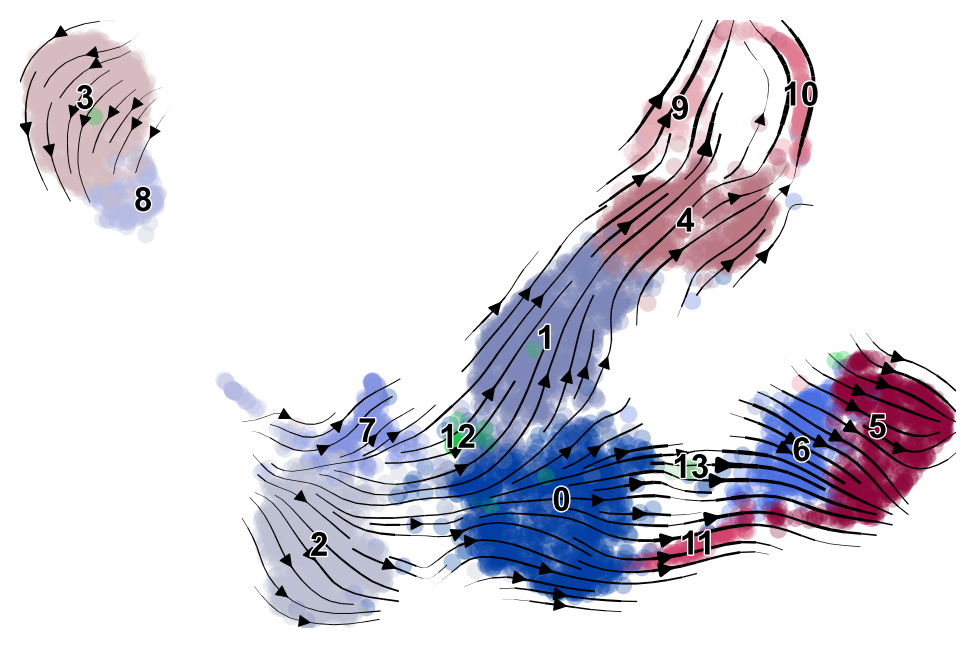

In [42]:
adata
scv.pl.velocity_embedding_stream(
    adata, basis="umap", smooth=0.5, min_mass=1,
    legend_fontsize=12, title="", color = "clusters"
)

In [43]:
# Identify terminal states
# it did not work well, see issue in https://github.com/theislab/cellrank/issues/399
cr.tl.terminal_states(adata, 
                      n_states = 2, 
                      cluster_key="clusters", 
                      weight_connectivities=0.2, 
                      force_recompute = True)

Computing transition matrix based on logits using `'deterministic'` mode


/Users/jingkui.wang/anaconda3/envs/cellrank/lib/python3.7/site-packages/ipykernel_launcher.py:7: DeprecationWarning: `cellrank.tl.terminal_states` will be removed in version `2.0`. Please use the `cellrank.kernels` or `cellrank.estimators` interface instead.
  import sys
/Users/jingkui.wang/anaconda3/envs/cellrank/lib/python3.7/site-packages/cellrank/tl/_init_term_states.py:161: DeprecationWarning: `cellrank.tl.transition_matrix` will be removed in version `2.0`. Please use the `cellrank.kernels` or `cellrank.estimators` interface instead.
  **kwargs,


Estimating `softmax_scale` using `'deterministic'` mode


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6000/6000 [00:34<00:00, 171.69cell/s]

Setting `softmax_scale=16.0205`



100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6000/6000 [00:35<00:00, 168.11cell/s]

    Finish (0:01:11)
Using a connectivity kernel with weight `0.2`
Computing transition matrix based on `adata.obsp['connectivities']`
    Finish (0:00:00)


Computing Schur decomposition
Mat Object: 1 MPI processes
  type: seqdense
1.0000000000000024e+00 -6.6620792735329875e-03 -2.2419183850669138e-02 -1.6948345501732312e-02 
0.0000000000000000e+00 9.9480516927686369e-01 -1.8839354140707545e-03 -5.8341678169227312e-03 
0.0000000000000000e+00 0.0000000000000000e+00 9.6978049190363469e-01 4.7838654033322867e-02 
0.0000000000000000e+00 0.0000000000000000e+00 0.0000000000000000e+00 9.6204545054660107e-01 
Adding `adata.uns['eigendecomposition_fwd']`
       `.schur_vectors`
       `.schur_matrix`
       `.eigendecomposition`
    Finish (0:00:05)
Computing `2` macrostates
Adding `.macrostates`
       `.macrostates_memberships`
       `.coarse_T`
       `.coarse_initial_distribution
       `.coarse_stationary_distribution`
       `.schur_vectors`
       `.schur_matrix`
       `.eigendecomposition`
    Finish (0:00:00)
Adding `adata.obs['terminal_states']`
       `adata.obs['terminal_states_probs']`
       `.terminal_states`
       `.terminal_stat

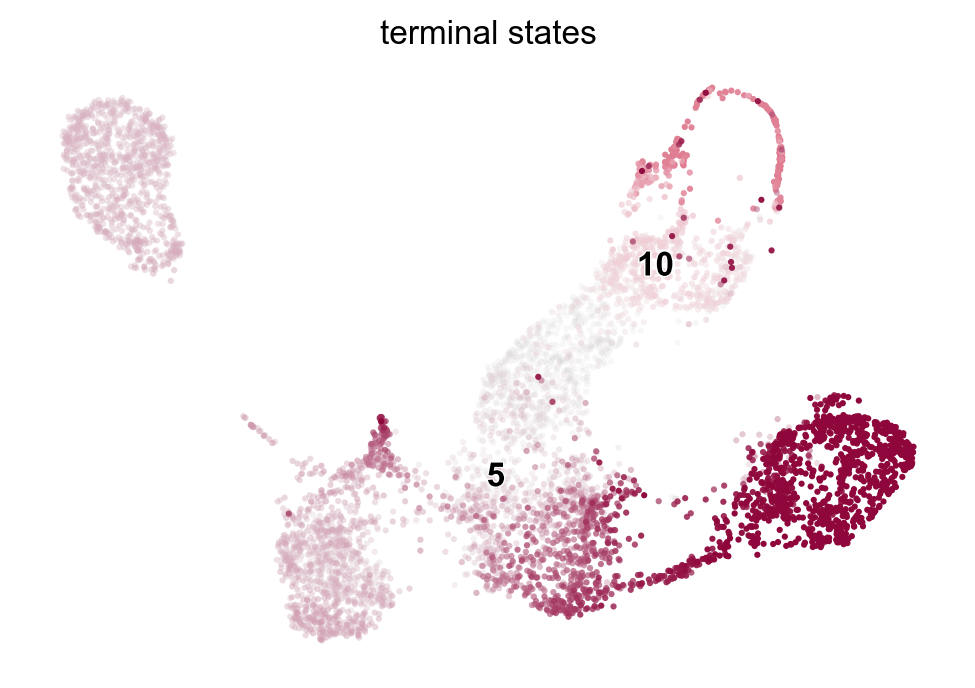

In [44]:
cr.pl.terminal_states(adata)

Accessing `adata.obsp['T_bwd']`
Computing transition matrix based on logits using `'deterministic'` mode


/Users/jingkui.wang/anaconda3/envs/cellrank/lib/python3.7/site-packages/ipykernel_launcher.py:4: DeprecationWarning: `cellrank.tl.initial_states` will be removed in version `2.0`. Please use the `cellrank.kernels` or `cellrank.estimators` interface instead.
  after removing the cwd from sys.path.
/Users/jingkui.wang/anaconda3/envs/cellrank/lib/python3.7/site-packages/cellrank/tl/_init_term_states.py:161: DeprecationWarning: `cellrank.tl.transition_matrix` will be removed in version `2.0`. Please use the `cellrank.kernels` or `cellrank.estimators` interface instead.
  **kwargs,


Estimating `softmax_scale` using `'deterministic'` mode


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6000/6000 [01:00<00:00, 99.74cell/s]

Setting `softmax_scale=16.0205`



100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6000/6000 [01:00<00:00, 99.70cell/s]


    Finish (0:02:01)
Using a connectivity kernel with weight `0.2`
Computing transition matrix based on `adata.obsp['connectivities']`
    Finish (0:00:00)
Computing eigendecomposition of the transition matrix
Adding `adata.uns['eigendecomposition_bwd']`
       `.eigendecomposition`
    Finish (0:00:01)
For 1 macrostate, stationary distribution is computed
Adding `.macrostates`
       `.macrostates_memberships`
       `.coarse_T`
       `.coarse_initial_distribution
       `.coarse_stationary_distribution`
       `.schur_vectors`
       `.schur_matrix`
       `.eigendecomposition`
    Finish (0:00:00)
Adding `adata.obs['initial_states']`
       `adata.obs['initial_states_probs']`
       `.terminal_states`
       `.terminal_states_probabilities`
       `.terminal_states_memberships
    Finish`


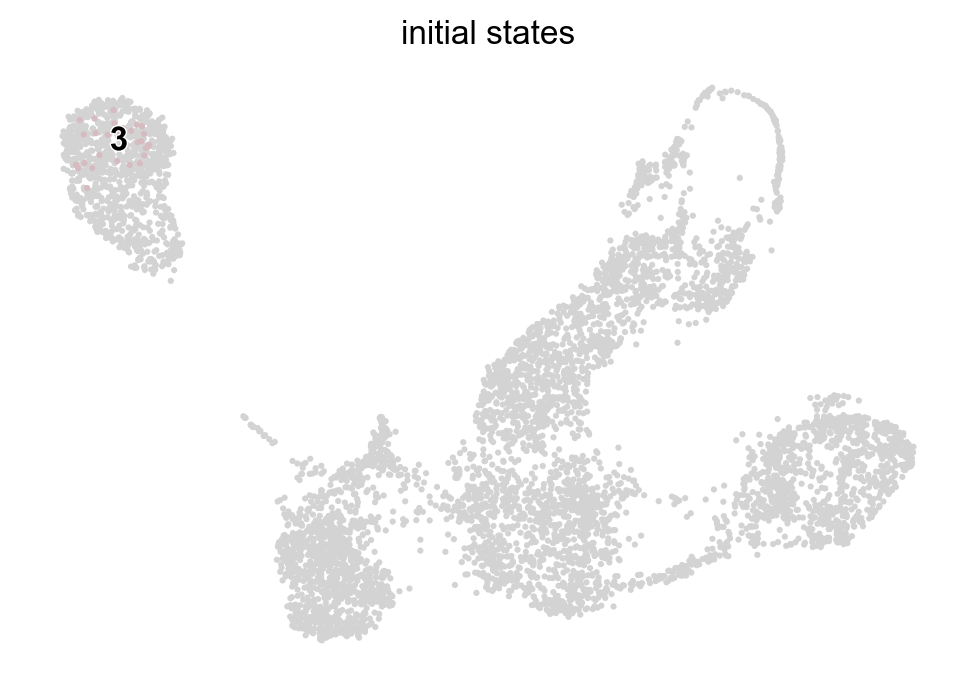

In [45]:
# Identify initial states
cr.tl.initial_states(adata, 
                     n_states = 1, 
                     cluster_key="clusters")
cr.pl.initial_states(adata, discrete=True)

Computing absorption probabilities


/Users/jingkui.wang/anaconda3/envs/cellrank/lib/python3.7/site-packages/ipykernel_launcher.py:2: DeprecationWarning: `cellrank.tl.lineages` will be removed in version `2.0`. Please use the `cellrank.kernels` or `cellrank.estimators` interface instead.
  
100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:00<00:00, 24.28/s]

Adding `adata.obsm['to_terminal_states']`
       `.absorption_probabilities`
    Finish (0:00:00)


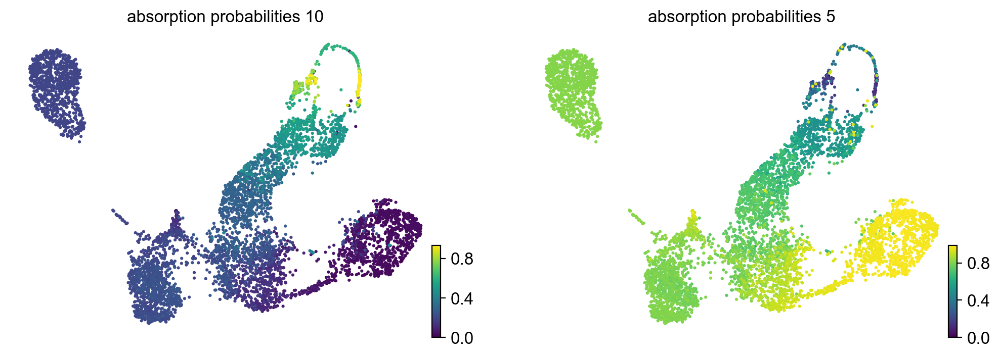

In [46]:
# Compute fate maps
cr.tl.lineages(adata)
cr.pl.lineages(adata, same_plot=False)

saving figure to file ../results/scRNAseq_R13547_10x_mNT_20220813/RA_symetryBreaking/cellRank_scvelo_d2.5.to.d6/CellRank_fatemap_stochasticModel.pdf


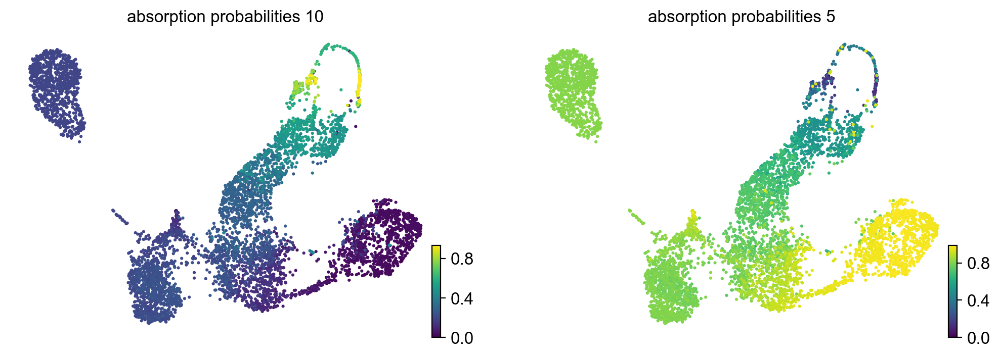

In [47]:
cr.pl.lineages(adata, same_plot=False, 
              save=os.path.join(input_Dir, "CellRank_fatemap_stochasticModel.pdf"))

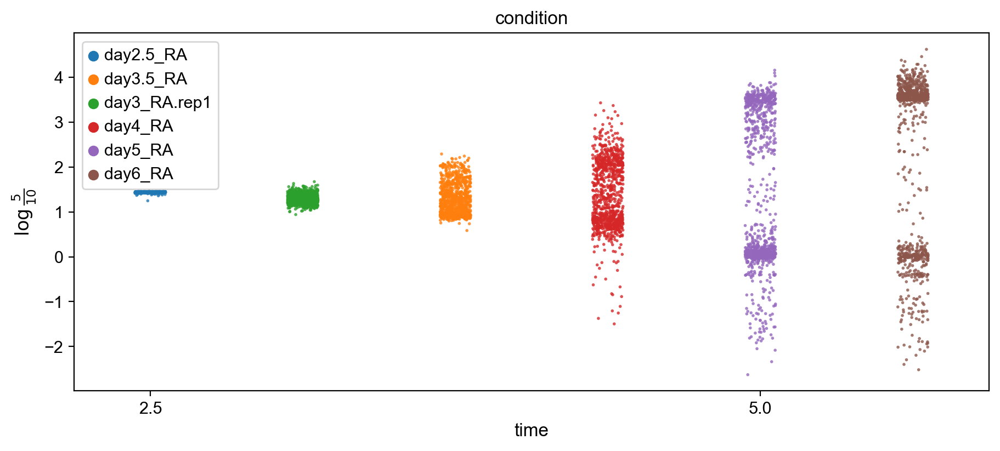

In [48]:
cr.pl.log_odds(
    adata,
    lineage_1="5",
    lineage_2="10",
    time_key="time",
    keys=["condition"],
    threshold=0,
    size=2,
    xticks_step_size=4,
    figsize=(9, 4),
)

In [ ]:
#### calculate pseudotime 

In [52]:
adata.uns['iroot'] = np.flatnonzero(adata.obs['clusters']  == '3')[0]

In [53]:
sc.tl.dpt(adata, n_branchings = 2)

figure cannot be saved as pdf, using png instead.
saving figure to file ../results/scRNAseq_R13547_10x_mNT_20220813/RA_symetryBreaking/cellRank_scvelo_d2.5.to.d6/scvelo_dpt_pseudotime.png


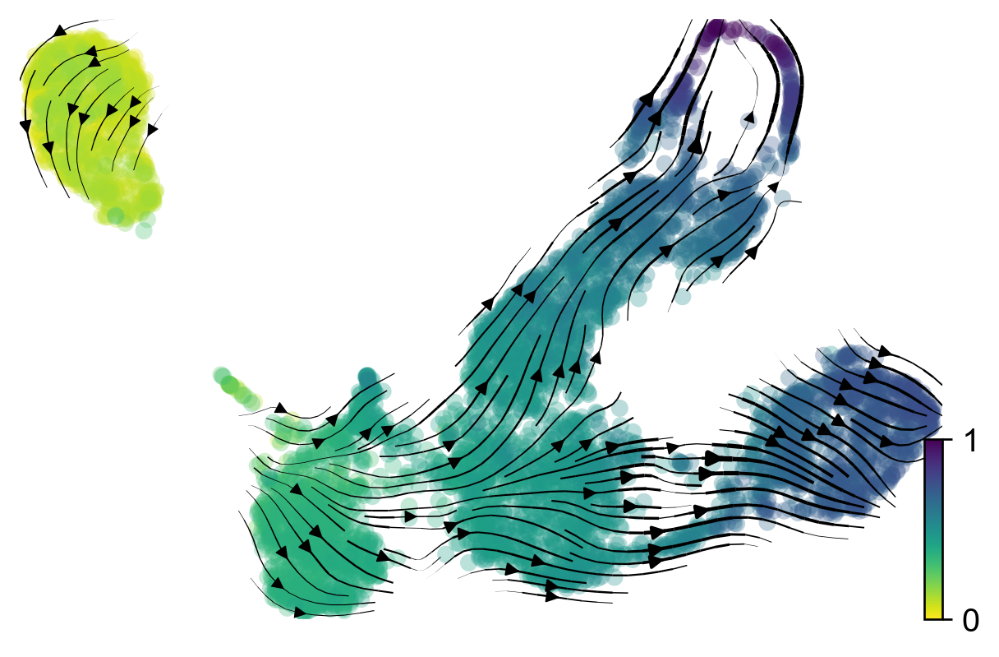

In [55]:
adata

AnnData object with n_obs × n_vars = 6000 × 3000
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'condition', 'iscell_dd', 'cell.id', 'percent.mt', 'DF_out', 'percent.rb', 'S.Score', 'G2M.Score', 'Phase', 'celltypes', 'RNA_snn_res.1', 'seurat_clusters', 'RNA_snn_res.0.7', 'clusters', 'time', 'nCount_spliced', 'nFeature_spliced', 'nCount_unspliced', 'nFeature_unspliced', 'initial_size_unspliced', 'initial_size_spliced', 'initial_size', 'n_counts', 'velocity_self_transition', 'terminal_states', 'terminal_states_probs', 'clusters_gradients', 'initial_states', 'initial_states_probs', 'velocity_pseudotime', 'latent_time', 'dpt_pseudotime', 'dpt_groups', 'dpt_order', 'dpt_order_indices'
    var: 'vst.mean', 'vst.variance', 'vst.variance.expected', 'vst.variance.standardized', 'vst.variable', 'spliced_features', 'unspliced_features', 'gene_count_corr', 'means', 'dispersions', 'dispersions_norm', 'highly_variable', 'fit_r2', 'fit_alpha', 'fit_beta', 'fit_gamma', 'fit_t_', 'fit_scaling', '

In [49]:
### Directed PAGA not used 

In [50]:
scv.tl.recover_latent_time(
    adata, root_key="initial_states_probs", end_key="terminal_states_probs"
)

computing latent time using initial_states_probs, terminal_states_probs as prior
    finished (0:00:01) --> added 
    'latent_time', shared time (adata.obs)


In [56]:
adata

AnnData object with n_obs × n_vars = 6000 × 3000
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'condition', 'iscell_dd', 'cell.id', 'percent.mt', 'DF_out', 'percent.rb', 'S.Score', 'G2M.Score', 'Phase', 'celltypes', 'RNA_snn_res.1', 'seurat_clusters', 'RNA_snn_res.0.7', 'clusters', 'time', 'nCount_spliced', 'nFeature_spliced', 'nCount_unspliced', 'nFeature_unspliced', 'initial_size_unspliced', 'initial_size_spliced', 'initial_size', 'n_counts', 'velocity_self_transition', 'terminal_states', 'terminal_states_probs', 'clusters_gradients', 'initial_states', 'initial_states_probs', 'velocity_pseudotime', 'latent_time', 'dpt_pseudotime', 'dpt_groups', 'dpt_order', 'dpt_order_indices'
    var: 'vst.mean', 'vst.variance', 'vst.variance.expected', 'vst.variance.standardized', 'vst.variable', 'spliced_features', 'unspliced_features', 'gene_count_corr', 'means', 'dispersions', 'dispersions_norm', 'highly_variable', 'fit_r2', 'fit_alpha', 'fit_beta', 'fit_gamma', 'fit_t_', 'fit_scaling', '

figure cannot be saved as pdf, using png instead.
saving figure to file ../results/scRNAseq_R13547_10x_mNT_20220813/RA_symetryBreaking/cellRank_scvelo_d2.5.to.d6/scvelo_velocity_pseudotime.png


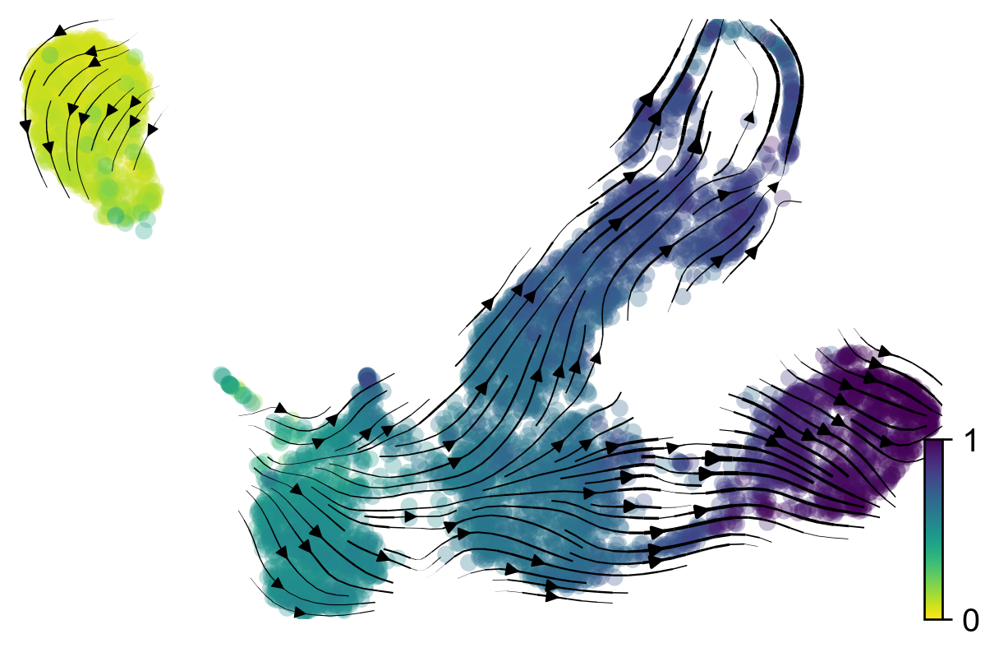

In [57]:
scv.pl.velocity_embedding_stream(
    adata, basis="umap", smooth=0.5, min_mass=1,
    legend_fontsize=12, title="", color = "velocity_pseudotime",
    dpi = 120,
    save=os.path.join(outDir, "scvelo_velocity_pseudotime.pdf")
)

figure cannot be saved as pdf, using png instead.
saving figure to file ../results/scRNAseq_R13547_10x_mNT_20220813/RA_symetryBreaking/cellRank_scvelo_d2.5.to.d6/scvelo_dpt_pseudotime.png


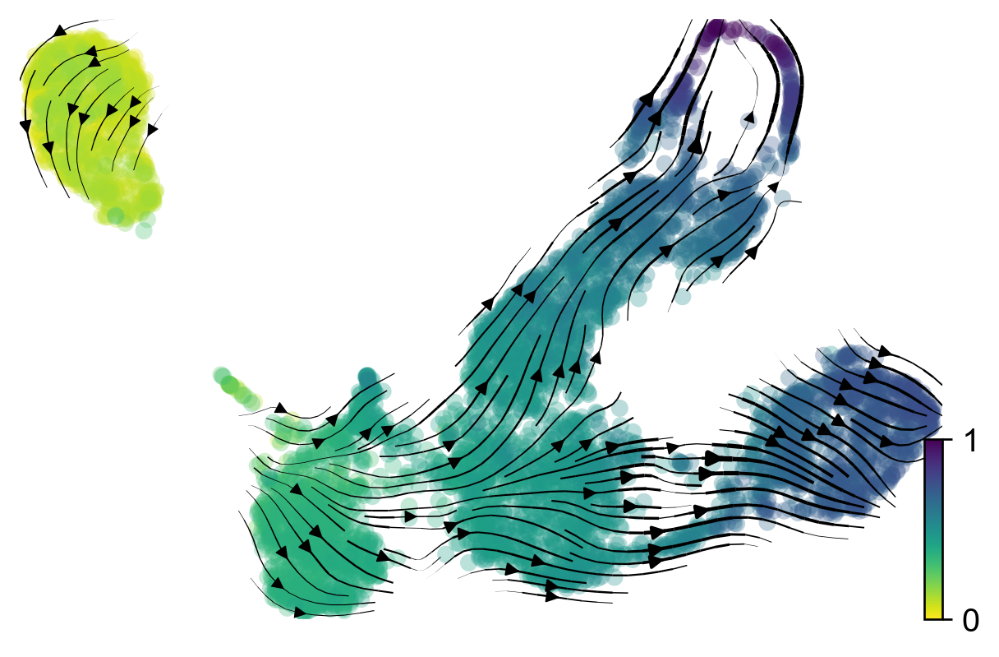

In [58]:
scv.pl.velocity_embedding_stream(
    adata, basis="umap", smooth=0.5, min_mass=1,
    legend_fontsize=12, title="", color = "dpt_pseudotime",
    dpi = 120,
    save=os.path.join(outDir, "scvelo_dpt_pseudotime.pdf")
)

figure cannot be saved as pdf, using png instead.
saving figure to file ../results/scRNAseq_R13547_10x_mNT_20220813/RA_symetryBreaking/cellRank_scvelo_d2.5.to.d6/scvelo_dpt_latent_time.png


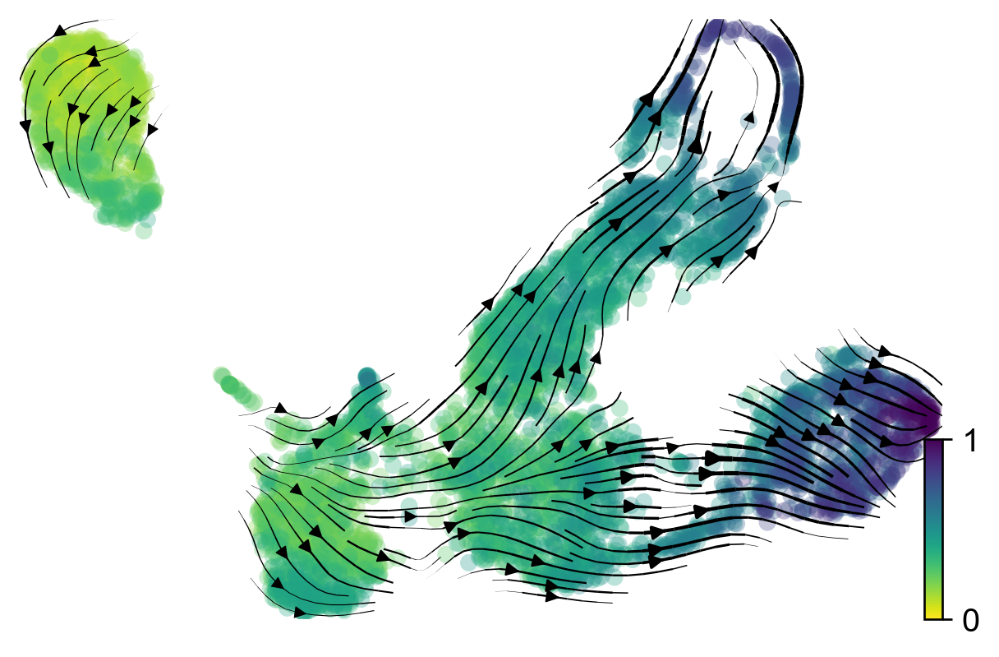

In [59]:
scv.pl.velocity_embedding_stream(
    adata, basis="umap", smooth=0.5, min_mass=1,
    legend_fontsize=12, title="", color = "latent_time",
    dpi = 120,
    save=os.path.join(outDir, "scvelo_dpt_latent_time.pdf")
)

In [46]:
scv.tl.paga(
    adata,
    groups="condition",
    root_key="initial_states_probs",
    end_key="terminal_states_probs",
    use_time_prior="velocity_pseudotime",
)


running PAGA using priors: ['velocity_pseudotime', 'initial_states_probs', 'terminal_states_probs']
    finished (0:00:01) --> added
    'paga/connectivities', connectivities adjacency (adata.uns)
    'paga/connectivities_tree', connectivities subtree (adata.uns)
    'paga/transitions_confidence', velocity transitions (adata.uns)


/Users/jingkui.wang/anaconda3/envs/cellrank/lib/python3.7/site-packages/networkx/convert.py:157: DeprecationWarning: 

The scipy.sparse array containers will be used instead of matrices
in Networkx 3.0. Use `from_scipy_sparse_array` instead.
  return nx.from_scipy_sparse_matrix(data, create_using=create_using)


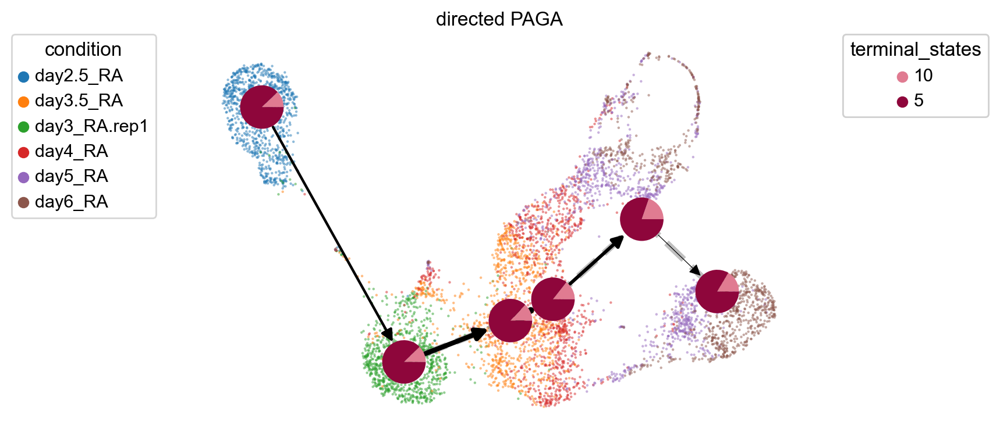

In [47]:
cr.pl.cluster_fates(
    adata,
    mode="paga_pie",
    cluster_key="condition",
    basis="umap",
    legend_kwargs={"loc": "top right out"},
    legend_loc="top left out",
    node_size_scale=5,
    edge_width_scale=1,
    max_edge_width=4,
    title="directed PAGA",
    save=os.path.join(input_Dir, "CellRank_PAGA_fateProb_condition_umapV3.pdf")
)


running PAGA using priors: ['velocity_pseudotime', 'initial_states_probs', 'terminal_states_probs']
    finished (0:00:01) --> added
    'paga/connectivities', connectivities adjacency (adata.uns)
    'paga/connectivities_tree', connectivities subtree (adata.uns)
    'paga/transitions_confidence', velocity transitions (adata.uns)


/Users/jingkui.wang/anaconda3/envs/cellrank/lib/python3.7/site-packages/networkx/convert.py:157: DeprecationWarning: 

The scipy.sparse array containers will be used instead of matrices
in Networkx 3.0. Use `from_scipy_sparse_array` instead.
  return nx.from_scipy_sparse_matrix(data, create_using=create_using)


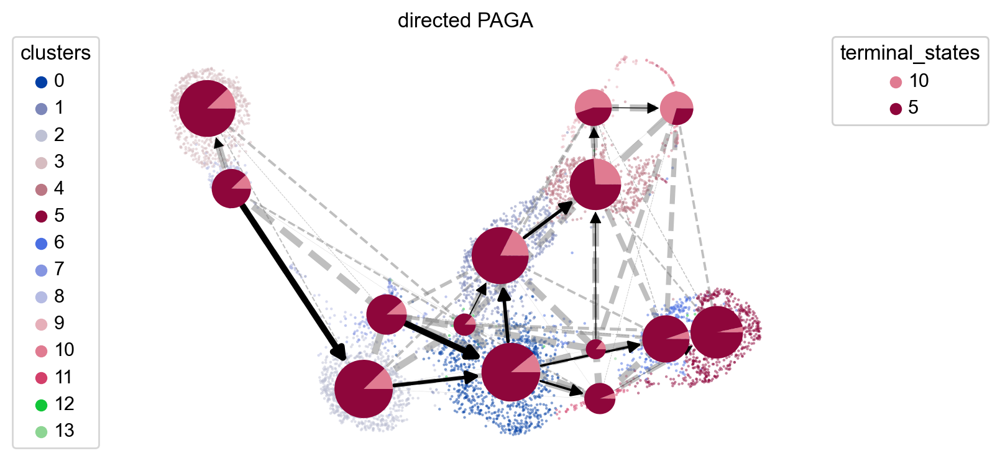

In [48]:
scv.tl.paga(
    adata,
    groups="clusters",
    root_key="initial_states_probs",
    end_key="terminal_states_probs",
    use_time_prior="velocity_pseudotime",
)
cr.pl.cluster_fates(
    adata,
    mode="paga_pie",
    cluster_key="clusters",
    basis="umap",
    legend_kwargs={"loc": "top right out"},
    legend_loc="top left out",
    node_size_scale=5,
    edge_width_scale=1,
    max_edge_width=4,
    title="directed PAGA",
    save=os.path.join(input_Dir, "CellRank_PAGA_fateProb_clusters_umapV3.pdf"),
)
